<a href="https://colab.research.google.com/github/areegtarek/Leaf-Classification/blob/main/Leaf_classification_using_ANN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **CISC 867: Project 1**

# **Leaf Classification**

Kaggle competition link: https://www.kaggle.com/c/leaf-classification/data?select=images.zip

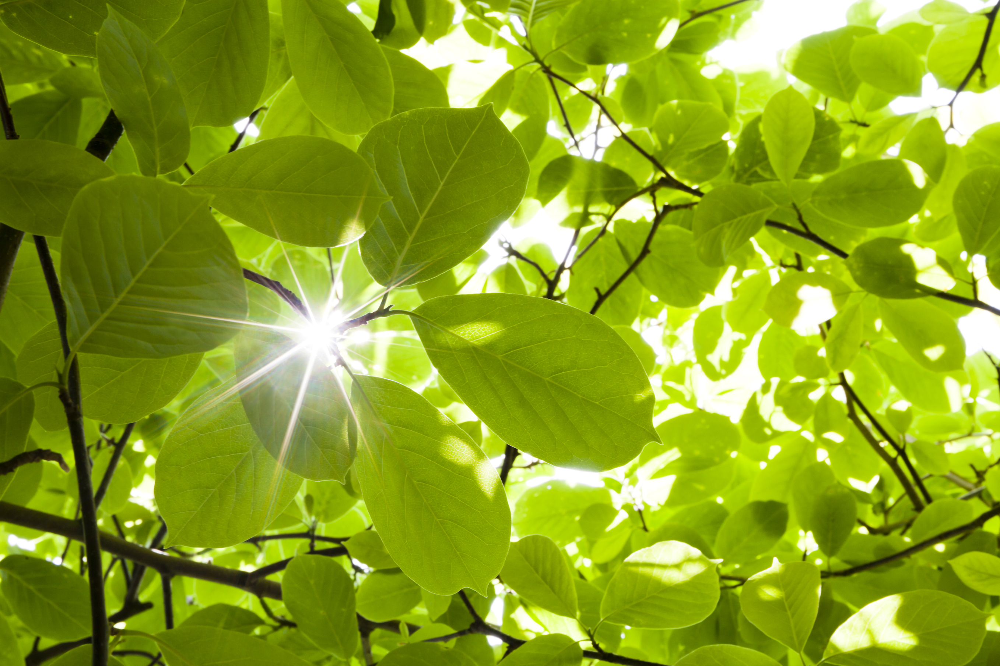

# **Dataset Description**

The dataset consists approximately 1,584 images of leaf specimens (16 samples each of 99 species) which have been converted to binary black leaves against white backgrounds. Three sets of features are also provided per image: a shape contiguous descriptor, an interior texture histogram, and a ﬁne-scale margin histogram. For each feature, a 64-attribute vector is given per leaf sample.

    Note that of the original 100 species, we have eliminated one on account of incomplete associated data in the original dataset.


**Data fields**

- id - an anonymous id unique to an image
- margin_1, margin_2, margin_3, ..., margin_64 - each of the 64 attribute vectors for the margin feature
- shape_1, shape_2, shape_3, ..., shape_64 - each of the 64 attribute vectors for the shape feature
- texture_1, texture_2, texture_3, ..., texture_64 - each of the 64 attribute vectors for the texture feature

# **Part I: Data Preparation**

#**import libraries**


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder # for categorical data
from sklearn.preprocessing import StandardScaler #to scale the data
import os
import random
import cv2 as cv
import keras.utils as image
from sklearn.utils import shuffle
import seaborn as sns
sns.set(
    font_scale=1.5,
    style="whitegrid",
    rc={'figure.figsize':(20,7)}
)

#**Read dataset**


In [ ]:
#reading the train data from path
df = pd.read_csv('/content/drive/MyDrive/Data Mining&DL/DL/Leaf-Classification-using-NN-main/train.csv')

#reading the train data as all columns except the first one(id column)
df = df.iloc[:,1:]

#displaying the first 5 rows from train data
df.head()

,species,margin1,margin2,margin3,margin4,margin5,margin6,margin7,margin8,margin9,...,texture55,texture56,texture57,texture58,texture59,texture60,texture61,texture62,texture63,texture64
0,Acer_Opalus,0.007812,0.023438,0.023438,0.003906,0.011719,0.009766,0.027344,0.0,0.001953,...,0.007812,0.000000,0.002930,0.002930,0.035156,0.0,0.0,0.004883,0.000000,0.025391
1,Pterocarya_Stenoptera,0.005859,0.000000,0.031250,0.015625,0.025391,0.001953,0.019531,0.0,0.000000,...,0.000977,0.000000,0.000000,0.000977,0.023438,0.0,0.0,0.000977,0.039062,0.022461
2,Quercus_Hartwissiana,0.005859,0.009766,0.019531,0.007812,0.003906,0.005859,0.068359,0.0,0.000000,...,0.154300,0.000000,0.005859,0.000977,0.007812,0.0,0.0,0.000000,0.020508,0.002930
3,Tilia_Tomentosa,0.000000,0.003906,0.023438,0.005859,0.021484,0.019531,0.023438,0.0,0.013672,...,0.000000,0.000977,0.000000,0.000000,0.020508,0.0,0.0,0.017578,0.000000,0.047852
4,Quercus_Variabilis,0.005859,0.003906,0.048828,0.009766,0.013672,0.015625,0.005859,0.0,0.000000,...,0.096680,0.000000,0.021484,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.031250


In [ ]:
#reading the test data from path
test = pd.read_csv('/content/drive/MyDrive/Data Mining&DL/DL/Leaf-Classification-using-NN-main/test.csv')

#reading the test data as all columns except the first one(id column)
test = test.iloc[:,1:]

#displaying the first 5 rows from test data
test.head()

,margin1,margin2,margin3,margin4,margin5,margin6,margin7,margin8,margin9,margin10,...,texture55,texture56,texture57,texture58,texture59,texture60,texture61,texture62,texture63,texture64
0,0.019531,0.009766,0.078125,0.011719,0.003906,0.015625,0.005859,0.0,0.005859,0.023438,...,0.006836,0.000000,0.015625,0.000977,0.015625,0.0,0.0,0.000000,0.003906,0.053711
1,0.007812,0.005859,0.064453,0.009766,0.003906,0.013672,0.007812,0.0,0.033203,0.023438,...,0.000000,0.000000,0.006836,0.001953,0.013672,0.0,0.0,0.000977,0.037109,0.044922
2,0.000000,0.000000,0.001953,0.021484,0.041016,0.000000,0.023438,0.0,0.011719,0.005859,...,0.128910,0.000000,0.000977,0.000000,0.000000,0.0,0.0,0.015625,0.000000,0.000000
3,0.000000,0.000000,0.009766,0.011719,0.017578,0.000000,0.003906,0.0,0.003906,0.001953,...,0.012695,0.015625,0.002930,0.036133,0.013672,0.0,0.0,0.089844,0.000000,0.008789
4,0.001953,0.000000,0.015625,0.009766,0.039062,0.000000,0.009766,0.0,0.005859,0.000000,...,0.000000,0.042969,0.016602,0.010742,0.041016,0.0,0.0,0.007812,0.009766,0.007812


#**Discover Data**

In [ ]:
# to describe train data to know some information about it
df.describe()

,margin1,margin2,margin3,margin4,margin5,margin6,margin7,margin8,margin9,margin10,...,texture55,texture56,texture57,texture58,texture59,texture60,texture61,texture62,texture63,texture64
count,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,...,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000
mean,0.017412,0.028539,0.031988,0.023280,0.014264,0.038579,0.019202,0.001083,0.007167,0.018639,...,0.036501,0.005024,0.015944,0.011586,0.016108,0.014017,0.002688,0.020291,0.008989,0.019420
std,0.019739,0.038855,0.025847,0.028411,0.018390,0.052030,0.017511,0.002743,0.008933,0.016071,...,0.063403,0.019321,0.023214,0.025040,0.015335,0.060151,0.011415,0.039040,0.013791,0.022768
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.001953,0.001953,0.013672,0.005859,0.001953,0.000000,0.005859,0.000000,0.001953,0.005859,...,0.000000,0.000000,0.000977,0.000000,0.004883,0.000000,0.000000,0.000000,0.000000,0.000977
50%,0.009766,0.011719,0.025391,0.013672,0.007812,0.015625,0.015625,0.000000,0.005859,0.015625,...,0.004883,0.000000,0.005859,0.000977,0.012695,0.000000,0.000000,0.003906,0.002930,0.011719
75%,0.025391,0.041016,0.044922,0.029297,0.017578,0.056153,0.029297,0.000000,0.007812,0.027344,...,0.043701,0.000000,0.022217,0.009766,0.021484,0.000000,0.000000,0.023438,0.012695,0.029297
max,0.087891,0.205080,0.156250,0.169920,0.111330,0.310550,0.091797,0.031250,0.076172,0.097656,...,0.429690,0.202150,0.172850,0.200200,0.106450,0.578130,0.151370,0.375980,0.086914,0.141600


In [ ]:
# to know some information about train data
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 990 entries, 0 to 989
Columns: 193 entries, species to texture64
dtypes: float64(192), object(1)
memory usage: 1.5+ MB


**Observation:** All columns of our data are float except the target column of object type 

In [ ]:
# to describe the correlation in train data
df.corr()

,margin1,margin2,margin3,margin4,margin5,margin6,margin7,margin8,margin9,margin10,...,texture55,texture56,texture57,texture58,texture59,texture60,texture61,texture62,texture63,texture64
margin1,1.000000,0.806390,-0.182829,-0.297807,-0.475874,0.767718,0.066273,-0.094137,-0.181496,0.397138,...,0.137158,-0.047771,0.126227,-0.024139,-0.168201,0.035072,-0.007581,-0.033159,-0.075171,0.030414
margin2,0.806390,1.000000,-0.204640,-0.315953,-0.444312,0.825762,-0.083273,-0.086428,-0.120276,0.162587,...,0.154407,-0.021096,0.123834,-0.063654,-0.157842,0.081069,-0.007057,-0.037405,-0.098957,-0.029532
margin3,-0.182829,-0.204640,1.000000,0.120042,-0.185007,-0.163976,0.095449,0.024350,-0.000042,0.008772,...,0.047347,-0.027618,0.007261,-0.021390,0.033505,-0.019850,0.084957,-0.081999,-0.148193,0.061780
margin4,-0.297807,-0.315953,0.120042,1.000000,0.029480,-0.261437,-0.268271,-0.047693,0.227543,-0.173986,...,-0.071974,-0.009537,-0.050529,-0.044318,0.088857,-0.052317,0.320644,-0.073886,0.050970,0.014343
margin5,-0.475874,-0.444312,-0.185007,0.029480,1.000000,-0.438587,-0.108178,0.056557,0.196745,-0.320647,...,-0.165622,0.059135,0.012938,0.155327,0.149420,0.006542,-0.109229,0.151675,0.022299,-0.148834
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
texture60,0.035072,0.081069,-0.019850,-0.052317,0.006542,0.066262,-0.034094,0.048647,-0.028292,0.020376,...,-0.129365,0.004412,-0.155187,0.240704,-0.183369,1.000000,-0.051838,0.265879,-0.089679,-0.190194
texture61,-0.007581,-0.007057,0.084957,0.320644,-0.109229,-0.050498,-0.163375,-0.079283,0.088517,-0.127373,...,-0.002235,0.053707,-0.072814,-0.084638,-0.023539,-0.051838,1.000000,-0.063582,-0.068065,0.036374
texture62,-0.033159,-0.037405,-0.081999,-0.073886,0.151675,-0.031555,0.015391,-0.048843,-0.031954,-0.014200,...,-0.217239,0.171577,-0.283316,0.563088,-0.128010,0.265879,-0.063582,1.000000,-0.058189,-0.245527
texture63,-0.075171,-0.098957,-0.148193,0.050970,0.022299,-0.132087,-0.001364,0.027758,-0.119494,-0.039193,...,-0.207887,0.002057,-0.064724,-0.059866,0.156568,-0.089679,-0.068065,-0.058189,1.000000,0.029305


In [ ]:
#check null values in train data
df.isnull().values.any() 

False

In [ ]:
#check null values in test data
test.isnull().values.any() 

False

**Observation:** There is nomissing values in train & test data

In [ ]:
# to check if our train data is duplicated or not
df.duplicated().sum()

0

In [ ]:
# to check if our test data is duplicated or not
test.duplicated().sum()

0

**Observation:** There is no duplicated data 

In [ ]:
# to know the value_counts in species feature
df["species"].value_counts()

Acer_Opalus                    10
Crataegus_Monogyna             10
Acer_Mono                      10
Magnolia_Heptapeta             10
Acer_Capillipes                10
                               ..
Alnus_Rubra                    10
Rhododendron_x_Russellianum    10
Cytisus_Battandieri            10
Liriodendron_Tulipifera        10
Sorbus_Aria                    10
Name: species, Length: 99, dtype: int64

#**Visualizing dataset**

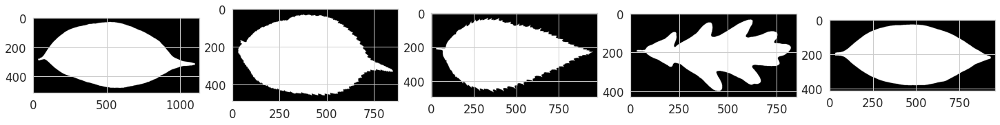

In [ ]:
# read some of images
os.chdir('/content/drive/MyDrive/Data Mining&DL/DL/Leaf-Classification-using-NN-main/images')
plt.figure(figsize=(25,25))
for i in range(5):
    w=np.random.choice((os.listdir()))
    plt.subplot(5,5,i+1)
    img=image.load_img(os.path.join('/content/drive/MyDrive/Data Mining&DL/DL/Leaf-Classification-using-NN-main/images',w))
    plt.imshow(img)
    plt.imshow(img)

In [ ]:
#plot correlation between columns
corr=df.corr()
corr.style.background_gradient(cmap='coolwarm')

<Axes: >

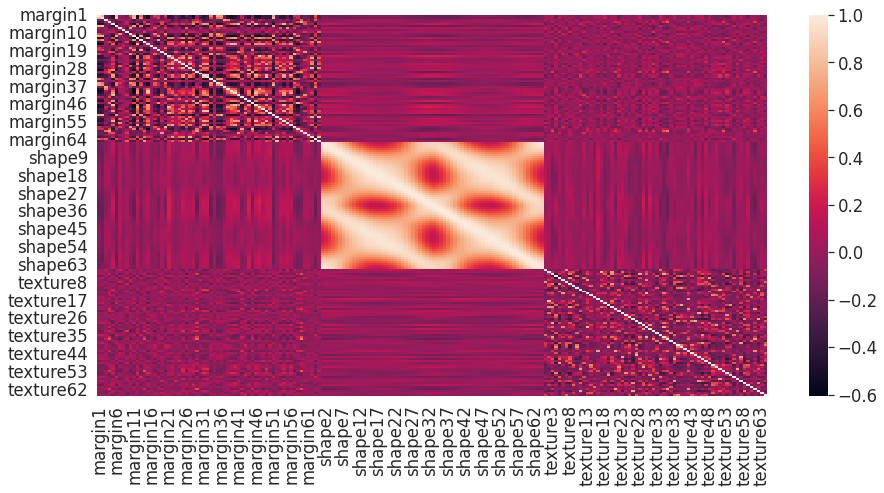

In [ ]:
plt.figure(figsize=(15,7))
sns.heatmap(data=df.corr())

#**Splitting data**

In [ ]:
# change the data with each other to prevent the overfitting 
df = shuffle(df)

In [ ]:
# to assign y and x to values
#trainData = trainData.values
X= df.values[:,1:]
y = df.values[:,0:1]

In [ ]:
#shape of training data
df.shape

(990, 193)

In [ ]:
#shape of training data features
X.shape

(990, 192)

In [ ]:
##shape of training data label
y.shape

(990, 1)

In [ ]:
#encode the target column(species)
encoder = LabelEncoder()
y_fit = encoder.fit(df.species)
y = y_fit.transform(df.species) 
classes = list(y_fit.classes_) 
classes

['Acer_Capillipes',
 'Acer_Circinatum',
 'Acer_Mono',
 'Acer_Opalus',
 'Acer_Palmatum',
 'Acer_Pictum',
 'Acer_Platanoids',
 'Acer_Rubrum',
 'Acer_Rufinerve',
 'Acer_Saccharinum',
 'Alnus_Cordata',
 'Alnus_Maximowiczii',
 'Alnus_Rubra',
 'Alnus_Sieboldiana',
 'Alnus_Viridis',
 'Arundinaria_Simonii',
 'Betula_Austrosinensis',
 'Betula_Pendula',
 'Callicarpa_Bodinieri',
 'Castanea_Sativa',
 'Celtis_Koraiensis',
 'Cercis_Siliquastrum',
 'Cornus_Chinensis',
 'Cornus_Controversa',
 'Cornus_Macrophylla',
 'Cotinus_Coggygria',
 'Crataegus_Monogyna',
 'Cytisus_Battandieri',
 'Eucalyptus_Glaucescens',
 'Eucalyptus_Neglecta',
 'Eucalyptus_Urnigera',
 'Fagus_Sylvatica',
 'Ginkgo_Biloba',
 'Ilex_Aquifolium',
 'Ilex_Cornuta',
 'Liquidambar_Styraciflua',
 'Liriodendron_Tulipifera',
 'Lithocarpus_Cleistocarpus',
 'Lithocarpus_Edulis',
 'Magnolia_Heptapeta',
 'Magnolia_Salicifolia',
 'Morus_Nigra',
 'Olea_Europaea',
 'Phildelphus',
 'Populus_Adenopoda',
 'Populus_Grandidentata',
 'Populus_Nigra',
 'Pr

In [ ]:
#display target column after encoding
y

array([22, 67, 84, 65, 93, 31, 65, 13, 61,  7,  3, 43, 22, 76, 31, 42,  9,
       11, 63, 85, 11, 30, 44, 27, 50,  0, 19,  0, 85, 97,  3, 90, 21,  7,
       93, 83, 38, 87,  4, 51, 10, 79, 76, 70, 81, 67, 62, 14, 97, 60,  0,
       81, 65, 74,  9, 18, 21, 33, 44, 88,  5, 95, 26, 96, 52, 52, 73, 47,
       76, 25, 37, 12, 81, 98, 42, 57, 81, 96,  0, 84, 98, 27, 77, 75, 95,
       80, 66,  8,  8, 77, 97, 37, 75, 86, 68, 65, 90, 46, 57, 24, 33, 90,
       19, 97, 32, 96, 47, 76, 28, 22,  5, 83, 85, 77, 31, 67, 57, 33, 46,
       13, 36, 18, 17, 66, 34, 72, 16,  5, 58, 62, 36, 30, 86, 42, 93, 58,
       62, 32, 78,  0, 79, 14, 50, 89, 84, 94, 77, 56, 45, 34, 62,  6, 75,
       20, 42, 45, 82,  9,  4, 28, 50, 61, 63, 23, 35, 28, 78, 22, 61, 31,
       13, 31, 44, 90, 73, 30,  9, 10, 94, 17,  0, 71, 86, 82, 20, 55, 92,
       26, 16, 81, 97,  3, 91, 86, 92, 42, 70, 37, 77, 78, 63, 16,  1, 15,
       79, 72, 51, 23, 23, 38, 81, 72, 63, 59, 24, 64, 74, 35, 45, 28, 29,
       74, 95, 85, 48,  6

In [ ]:
#number of unique values in label column
df['species'].nunique()

99

In [ ]:
len(y)

990

#**Split to train & validation data**

In [ ]:
from sklearn.model_selection  import train_test_split
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size = 0.2, random_state = 42)

#**Scaling**

In [ ]:
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_val = scaler.transform(X_val)
test=scaler.transform(test)

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


# **Part II: Training a neural network**

#**Model**

In [ ]:
# Part 2 - Now let's make the ANN!
import tensorflow
# Importing the Keras libraries and packages
from keras.models import Sequential  #to initialize the neural network
from keras.layers import Dense  # to build the layers of ANN
from keras.layers import Dropout
import keras
from keras import regularizers
from keras.callbacks import EarlyStopping

In [ ]:
#Trining function
def training(optemizer):

  # structure model
  features= X_train.shape[1]
  model = Sequential()
  
  model.add(Dense(units = 512, activation = 'tanh', input_shape=(features,)))



  model.add(Dense(units=99, activation = 'softmax'))

  # Compiling the ANN

  early_stop = EarlyStopping(monitor='val_accuracy', mode='max', min_delta=0.001)
  model.compile(optemizer, loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])

  # Fitting the ANN to the Training set
  history= model.fit(X_train, y_train,validation_data=(X_val, y_val), batch_size = 32, epochs = 100)

  return model,history

In [ ]:
#evaluation function
def evaluate(model,x,y):
  loss,acc=model.evaluate(x,y)
  print("\n loss= ",loss)
  print("\n Accuracy= ",acc)

## **by using different hyperparameters**

##**optimizer**

###**Trial_1 (Adam)**

In [ ]:
model,history= training("adam")
model

Epoch 1/100
25/25 [==============================] - 2s 24ms/step - loss: 3.0165 - accuracy: 0.4217 - val_loss: 1.6600 - val_accuracy: 0.7677
Epoch 2/100
25/25 [==============================] - 0s 11ms/step - loss: 0.7988 - accuracy: 0.9432 - val_loss: 0.6721 - val_accuracy: 0.9444
Epoch 3/100
25/25 [==============================] - 0s 10ms/step - loss: 0.2927 - accuracy: 0.9874 - val_loss: 0.3927 - val_accuracy: 0.9646
Epoch 4/100
25/25 [==============================] - 0s 8ms/step - loss: 0.1586 - accuracy: 0.9962 - val_loss: 0.2913 - val_accuracy: 0.9596
Epoch 5/100
25/25 [==============================] - 0s 8ms/step - loss: 0.1041 - accuracy: 0.9987 - val_loss: 0.2399 - val_accuracy: 0.9747
Epoch 6/100
25/25 [==============================] - 0s 10ms/step - loss: 0.0722 - accuracy: 1.0000 - val_loss: 0.1945 - val_accuracy: 0.9747
Epoch 7/100
25/25 [==============================] - 0s 10ms/step - loss: 0.0543 - accuracy: 0.9987 - val_loss: 0.1744 - val_accuracy: 0.9848
Epoch 8/

In [ ]:
evaluate(model,X_train,y_train)

25/25 [==============================] - 0s 2ms/step - loss: 5.1532e-04 - accuracy: 1.0000

 loss=  0.0005153196980245411

 Accuracy=  1.0


In [ ]:
evaluate(model,X_val,y_val)

7/7 [==============================] - 0s 3ms/step - loss: 0.0645 - accuracy: 0.9747

 loss=  0.06453773379325867

 Accuracy=  0.9747474789619446


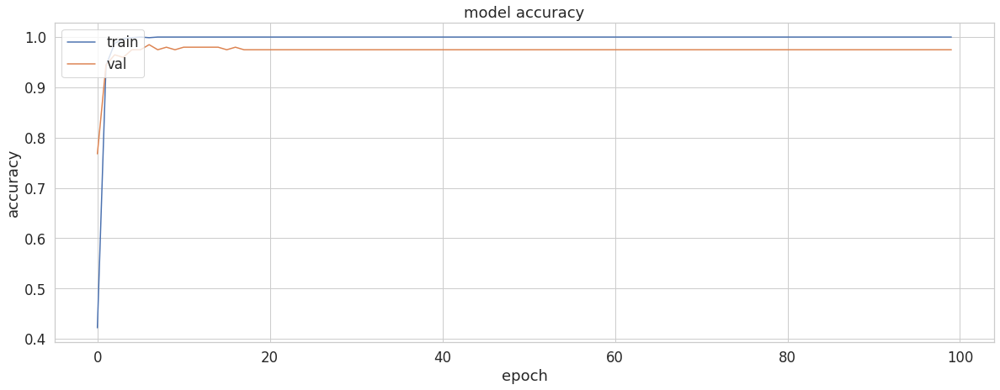

In [ ]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()


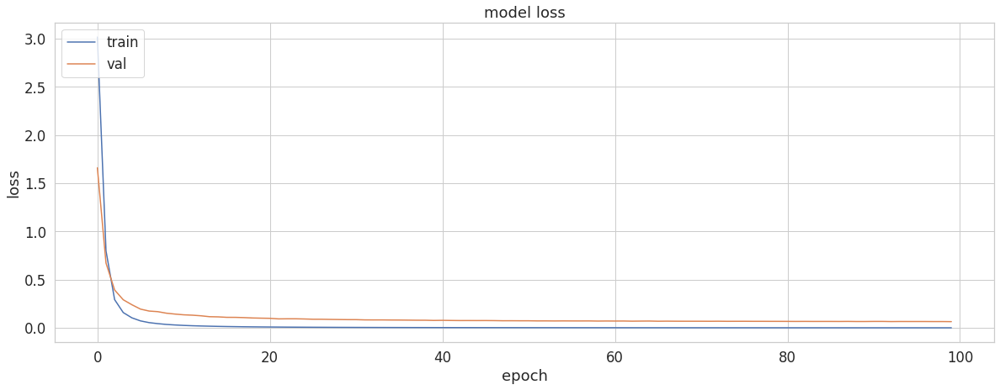

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

###**Trial_2 (SGD)**

In [ ]:
model,history= training("SGD")

Epoch 1/100
25/25 [==============================] - 1s 12ms/step - loss: 4.6231 - accuracy: 0.0341 - val_loss: 4.4622 - val_accuracy: 0.0404
Epoch 2/100
25/25 [==============================] - 0s 7ms/step - loss: 4.0570 - accuracy: 0.1111 - val_loss: 4.0113 - val_accuracy: 0.1212
Epoch 3/100
25/25 [==============================] - 0s 6ms/step - loss: 3.5628 - accuracy: 0.2500 - val_loss: 3.6232 - val_accuracy: 0.2374
Epoch 4/100
25/25 [==============================] - 0s 6ms/step - loss: 3.1353 - accuracy: 0.4255 - val_loss: 3.2828 - val_accuracy: 0.3485
Epoch 5/100
25/25 [==============================] - 0s 6ms/step - loss: 2.7649 - accuracy: 0.5606 - val_loss: 2.9837 - val_accuracy: 0.4293
Epoch 6/100
25/25 [==============================] - 0s 4ms/step - loss: 2.4432 - accuracy: 0.6717 - val_loss: 2.7176 - val_accuracy: 0.5000
Epoch 7/100
25/25 [==============================] - 0s 4ms/step - loss: 2.1658 - accuracy: 0.7576 - val_loss: 2.4817 - val_accuracy: 0.5960
Epoch 8/100


In [ ]:
evaluate(model,X_train,y_train)

25/25 [==============================] - 0s 5ms/step - loss: 0.0792 - accuracy: 1.0000

 loss=  0.07923229038715363

 Accuracy=  1.0


In [ ]:
evaluate(model,X_val,y_val)

7/7 [==============================] - 0s 4ms/step - loss: 0.2441 - accuracy: 0.9697

 loss=  0.24410182237625122

 Accuracy=  0.9696969985961914


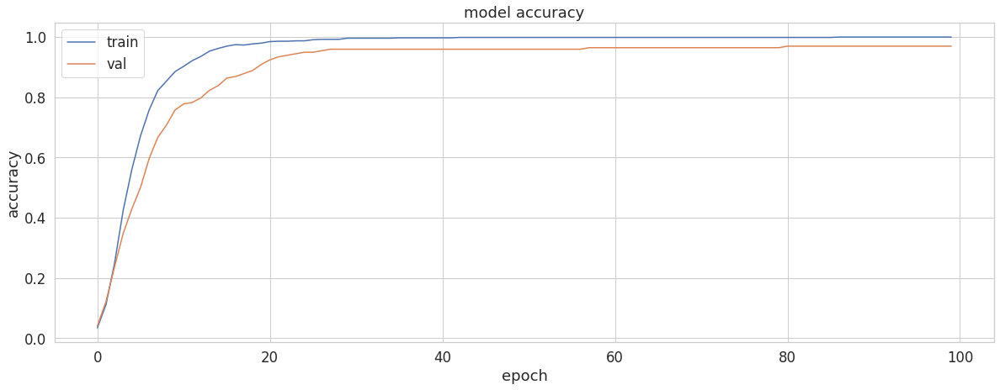

In [ ]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()


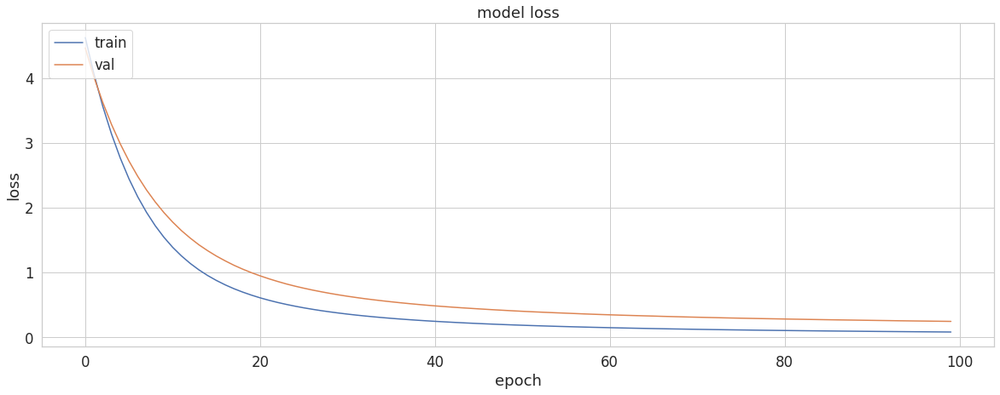

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

###**Trial_3 (RMSProp)**

In [ ]:
model,history= training("RMSProp")

Epoch 1/100
25/25 [==============================] - 1s 9ms/step - loss: 2.6825 - accuracy: 0.4912 - val_loss: 1.5429 - val_accuracy: 0.7576
Epoch 2/100
25/25 [==============================] - 0s 5ms/step - loss: 0.7749 - accuracy: 0.9280 - val_loss: 0.7417 - val_accuracy: 0.9040
Epoch 3/100
25/25 [==============================] - 0s 4ms/step - loss: 0.3025 - accuracy: 0.9848 - val_loss: 0.3600 - val_accuracy: 0.9394
Epoch 4/100
25/25 [==============================] - 0s 5ms/step - loss: 0.1328 - accuracy: 0.9962 - val_loss: 0.2751 - val_accuracy: 0.9545
Epoch 5/100
25/25 [==============================] - 0s 7ms/step - loss: 0.0721 - accuracy: 0.9924 - val_loss: 0.2010 - val_accuracy: 0.9444
Epoch 6/100
25/25 [==============================] - 0s 5ms/step - loss: 0.0349 - accuracy: 0.9975 - val_loss: 0.1699 - val_accuracy: 0.9697
Epoch 7/100
25/25 [==============================] - 0s 7ms/step - loss: 0.0224 - accuracy: 0.9975 - val_loss: 0.1642 - val_accuracy: 0.9495
Epoch 8/100
2

In [ ]:
evaluate(model,X_train,y_train)

25/25 [==============================] - 0s 11ms/step - loss: 1.7242e-04 - accuracy: 1.0000

 loss=  0.0001724203902995214

 Accuracy=  1.0


In [ ]:
evaluate(model,X_val,y_val)

7/7 [==============================] - 0s 5ms/step - loss: 0.0841 - accuracy: 0.9747

 loss=  0.0841318890452385

 Accuracy=  0.9747474789619446


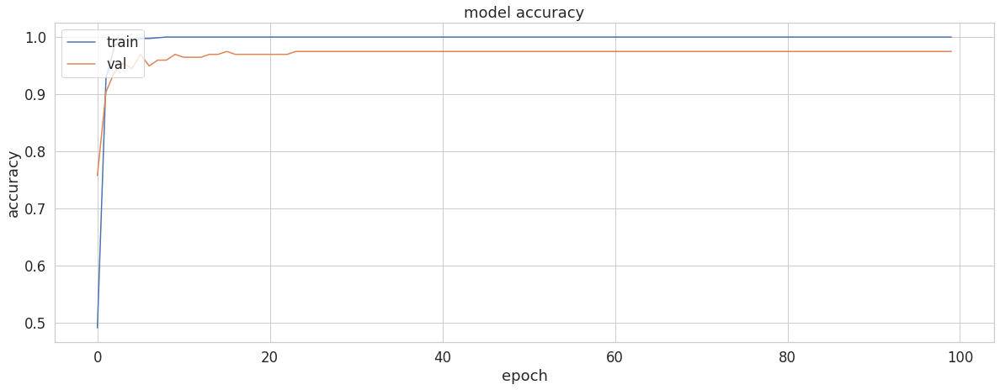

In [ ]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()


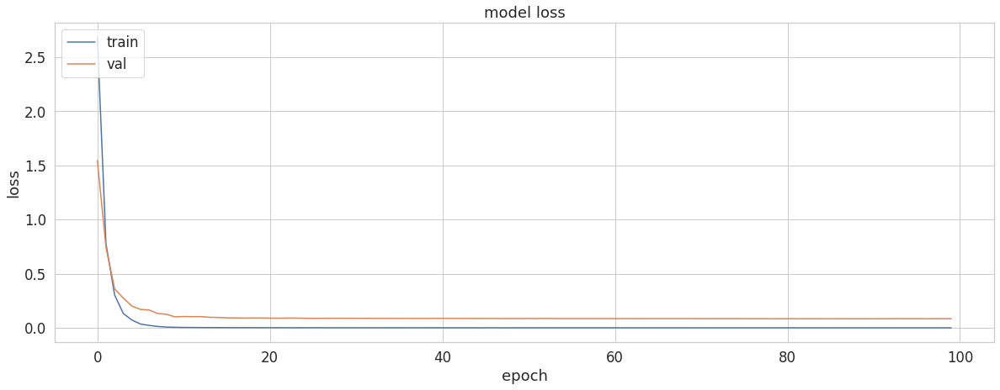

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

**Observation:** From the previous trials, we discovered that **RMSProp** optimizer is the best optimizer

###**Learning rate**

In [ ]:
from keras import regularizers
from keras.callbacks import EarlyStopping
def training(lr):

  # structure model
  features= X_train.shape[1]
  model = Sequential()
  
  model.add(Dense(units = 512, activation = 'tanh', input_shape=(features,)))



  model.add(Dense(units=99, activation = 'softmax'))

  # Compiling the ANN
  early_stop = EarlyStopping(monitor='val_accuracy', mode='max', min_delta=0.001)
  opt = tensorflow.keras.optimizers.Adam(lr)
  model.compile(opt, loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])

  # Fitting the ANN to the Training set
  history= model.fit(X_train, y_train,validation_data=(X_val, y_val), batch_size = 32, epochs = 100,verbose=0)

  return model,history

###**Trial_4 (0.01)**

In [ ]:
model,history= training(.01)

In [ ]:
evaluate(model,X_train,y_train)

25/25 [==============================] - 0s 2ms/step - loss: 3.6111e-06 - accuracy: 1.0000

 loss=  3.611129386626999e-06

 Accuracy=  1.0


In [ ]:
evaluate(model,X_val,y_val)

7/7 [==============================] - 0s 4ms/step - loss: 0.4608 - accuracy: 0.9293

 loss=  0.46077582240104675

 Accuracy=  0.9292929172515869


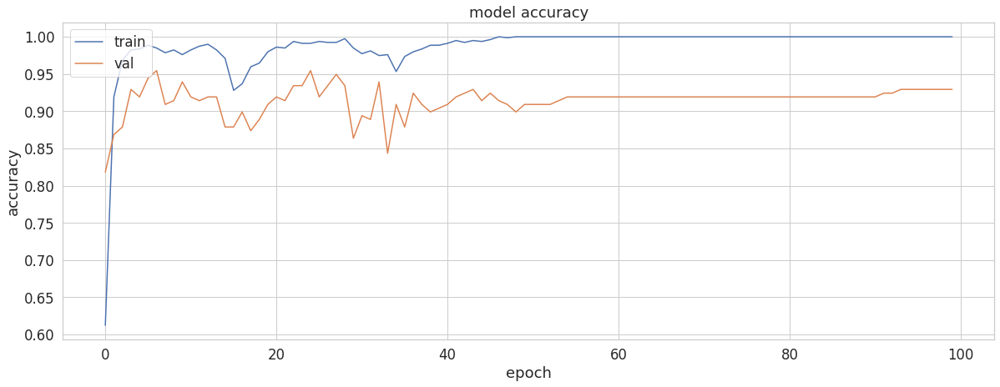

In [ ]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()


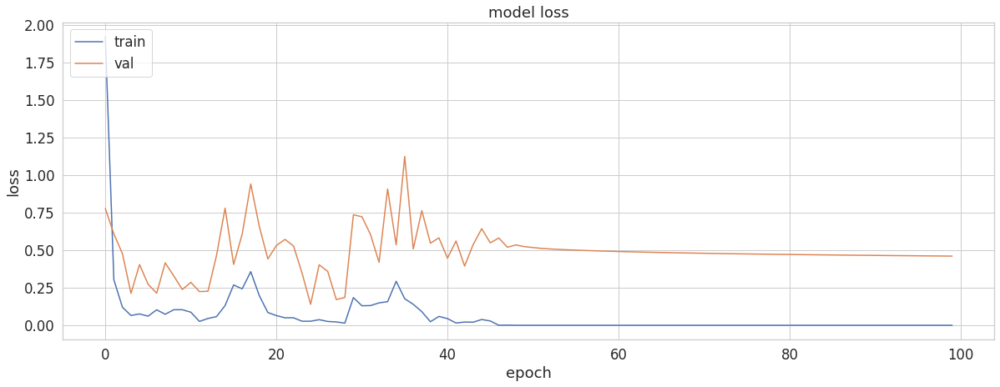

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

###**Trial_5(0.001)**

In [ ]:
model,history= training(0.001)

In [ ]:
evaluate(model,X_train,y_train)

25/25 [==============================] - 0s 3ms/step - loss: 5.1741e-04 - accuracy: 1.0000

 loss=  0.0005174073157832026

 Accuracy=  1.0


In [ ]:
evaluate(model,X_val,y_val)

7/7 [==============================] - 0s 3ms/step - loss: 0.0819 - accuracy: 0.9697

 loss=  0.08185632526874542

 Accuracy=  0.9696969985961914


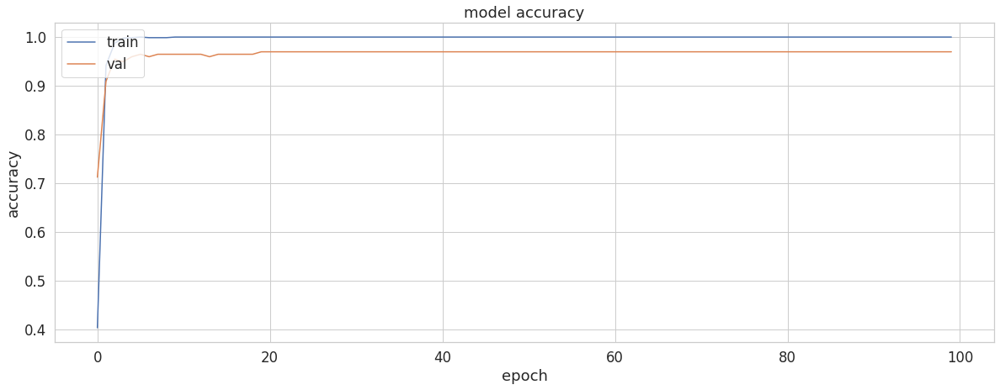

In [ ]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()


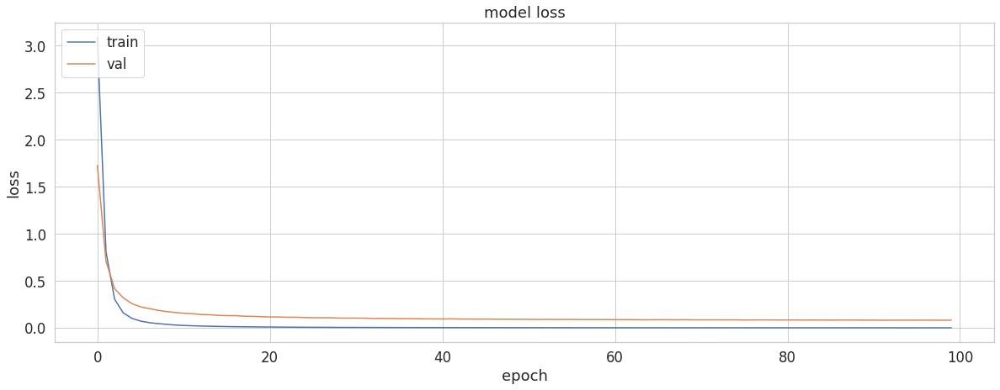

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

###**Trial_6(0.0001)**

In [ ]:
model,history= training(0.0001)

In [ ]:
evaluate(model,X_train,y_train)

25/25 [==============================] - 0s 2ms/step - loss: 0.0224 - accuracy: 1.0000

 loss=  0.022419188171625137

 Accuracy=  1.0


In [ ]:
evaluate(model,X_val,y_val)

7/7 [==============================] - 0s 3ms/step - loss: 0.1341 - accuracy: 0.9798

 loss=  0.13413125276565552

 Accuracy=  0.9797979593276978


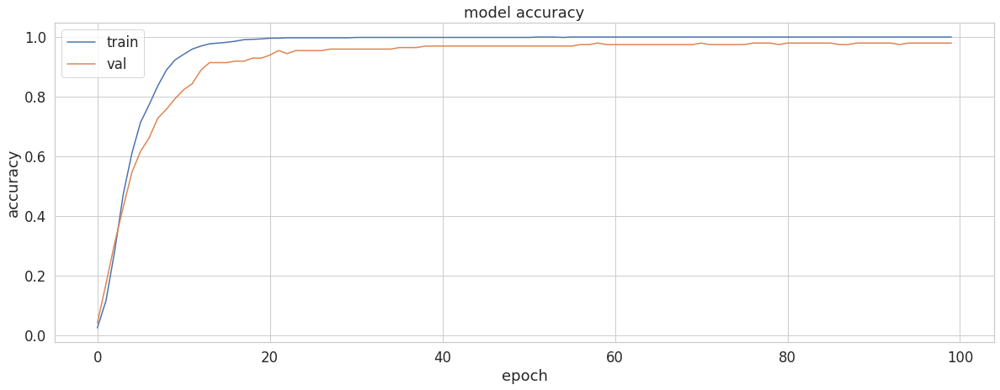

In [ ]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()


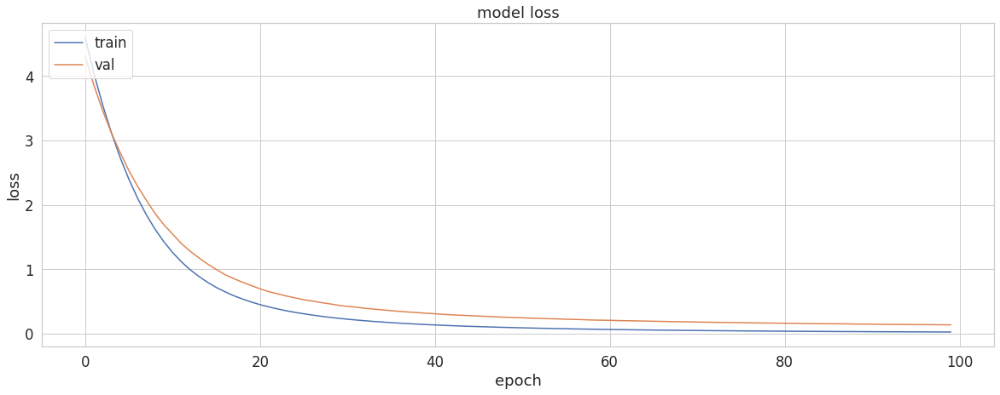

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

**Observation:** From the previous trials, we discover that the best learning **rate =0.001**

##**Batch_size**

In [ ]:
def training(batch):

  # structure model
  features= X_train.shape[1]
  model = Sequential()
  
  model.add(Dense(units = 512, activation = 'tanh', input_shape=(features,)))



  model.add(Dense(units=99, activation = 'softmax'))

  # Compiling the ANN
  early_stop = EarlyStopping(monitor='val_accuracy', mode='max', min_delta=0.001)
  opt = keras.optimizers.RMSprop(learning_rate=0.001)
  model.compile(opt, loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])

  # Fitting the ANN to the Training set
  history= model.fit(X_train, y_train,validation_data=(X_val, y_val), batch_size = batch, epochs = 100,verbose=0)

  return model,history

###**Trial_7 (32)**

In [ ]:
model,history= training(32)

In [ ]:
evaluate(model,X_train,y_train)

25/25 [==============================] - 0s 2ms/step - loss: 3.6877e-08 - accuracy: 1.0000

 loss=  3.687661020990163e-08

 Accuracy=  1.0


In [ ]:
evaluate(model,X_val,y_val)

7/7 [==============================] - 0s 2ms/step - loss: 0.1018 - accuracy: 0.9747

 loss=  0.1017543226480484

 Accuracy=  0.9747474789619446


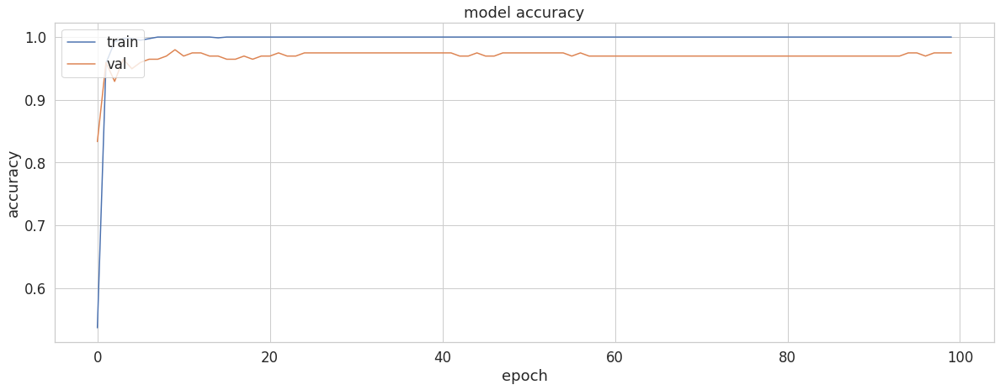

In [ ]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()


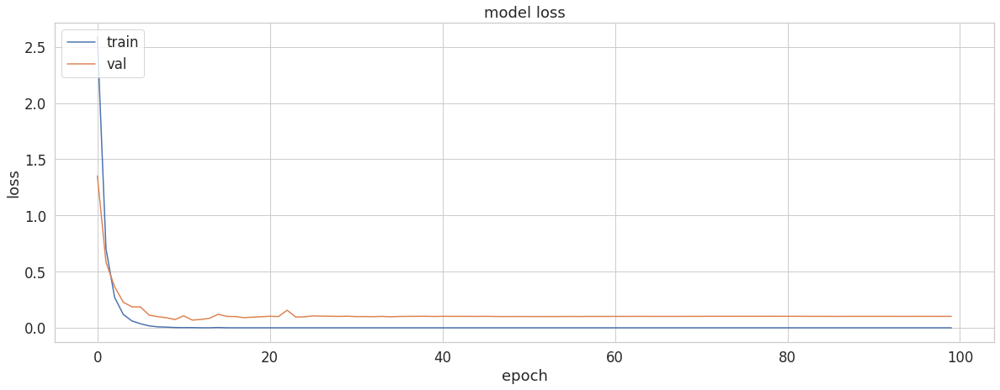

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

###**Trial_8(64)**

In [ ]:
model,history= training(64)

In [ ]:
evaluate(model,X_train,y_train)

25/25 [==============================] - 0s 3ms/step - loss: 9.6481e-08 - accuracy: 1.0000

 loss=  9.648124432715122e-08

 Accuracy=  1.0


In [ ]:
evaluate(model,X_val,y_val)

7/7 [==============================] - 0s 4ms/step - loss: 0.0876 - accuracy: 0.9747

 loss=  0.08758507668972015

 Accuracy=  0.9747474789619446


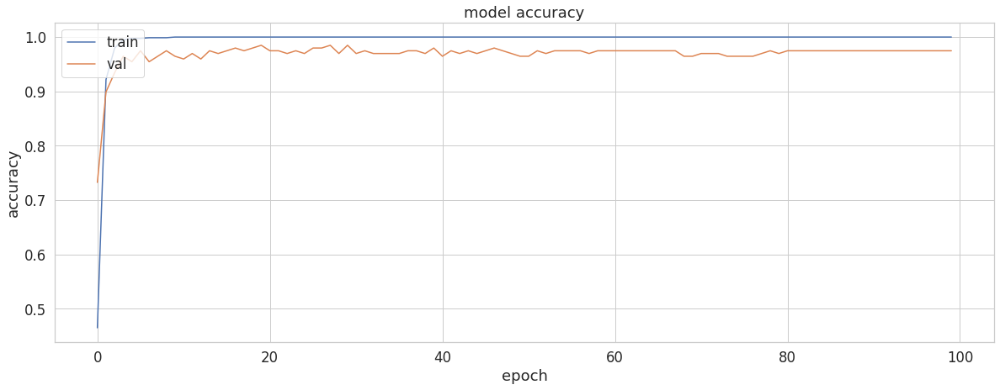

In [ ]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()


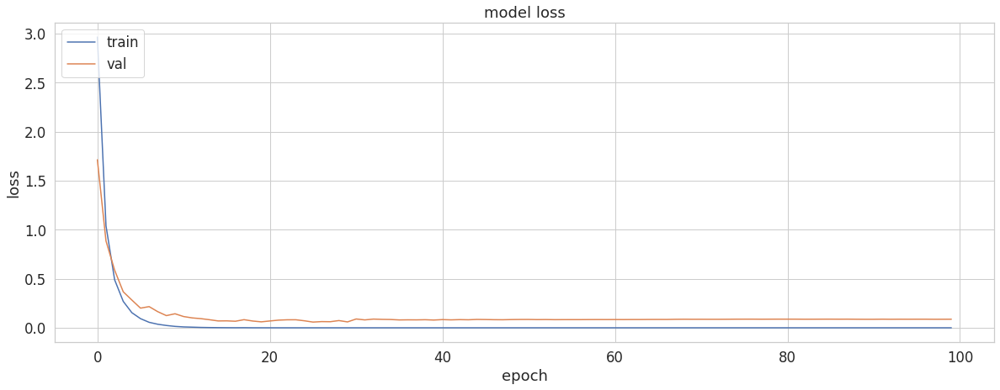

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

###**Trial_9(128)** 

In [ ]:
model,history= training(128)

In [ ]:
evaluate(model,X_train,y_train)

25/25 [==============================] - 0s 2ms/step - loss: 2.6867e-07 - accuracy: 1.0000

 loss=  2.6867243718697864e-07

 Accuracy=  1.0


In [ ]:
evaluate(model,X_val,y_val)

7/7 [==============================] - 0s 3ms/step - loss: 0.0901 - accuracy: 0.9646

 loss=  0.09010803699493408

 Accuracy=  0.9646464586257935


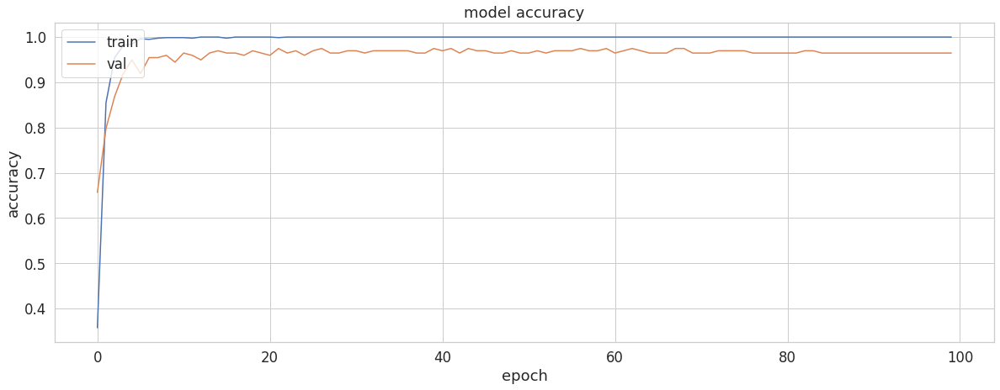

In [ ]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()


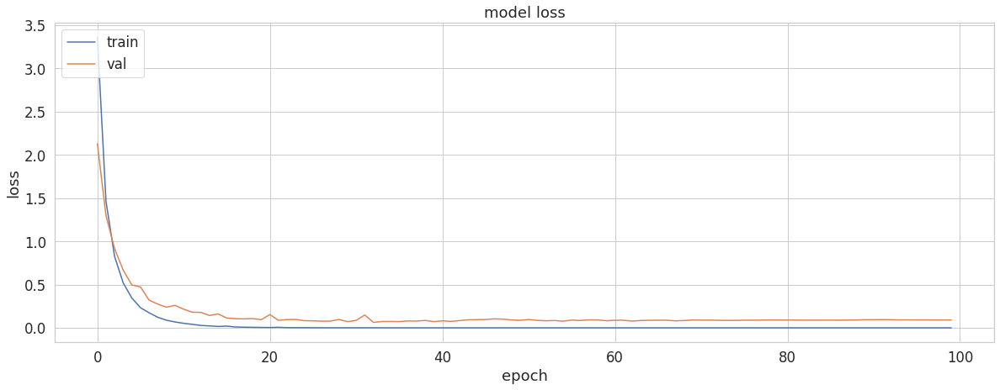

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

**Observation:** From the previous trials, we discovered that the best **batch_size=32**

##**Hidden units**

In [ ]:
def training(unit):

  # structure model
  features= X_train.shape[1]
  model = Sequential()
  
  model.add(Dense(units = unit, activation = 'tanh', input_shape=(features,)))


  model.add(Dense(units=99, activation = 'softmax'))

  # Compiling the ANN
  early_stop = EarlyStopping(monitor='val_accuracy', mode='max', min_delta=0.001)
  opt = keras.optimizers.RMSprop(learning_rate=0.001)
  model.compile(opt, loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])

  # Fitting the ANN to the Training set
  history= model.fit(X_train, y_train,validation_data=(X_val, y_val), batch_size = 32, epochs = 100,verbose=0)

  return model,history

###**Trial_10 (64)**

In [ ]:
model,history= training(64)

In [ ]:
evaluate(model,X_train,y_train)

25/25 [==============================] - 0s 2ms/step - loss: 7.2880e-07 - accuracy: 1.0000

 loss=  7.288020356099878e-07

 Accuracy=  1.0


In [ ]:
evaluate(model,X_val,y_val)

7/7 [==============================] - 0s 2ms/step - loss: 0.0623 - accuracy: 0.9747

 loss=  0.062282808125019073

 Accuracy=  0.9747474789619446


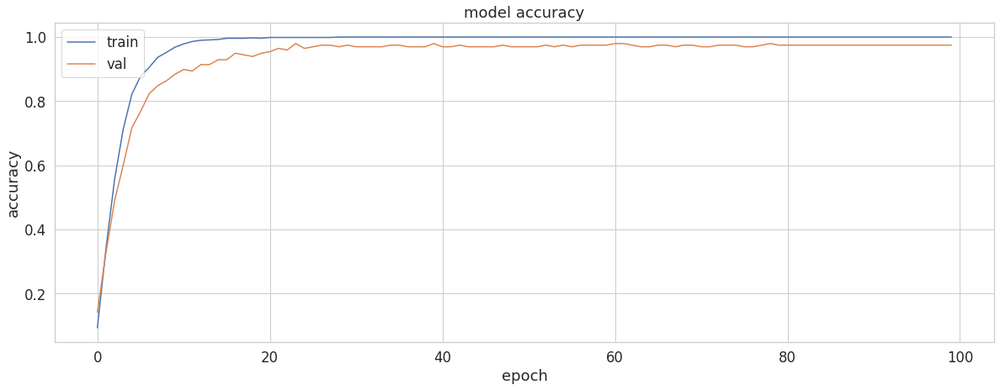

In [ ]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()


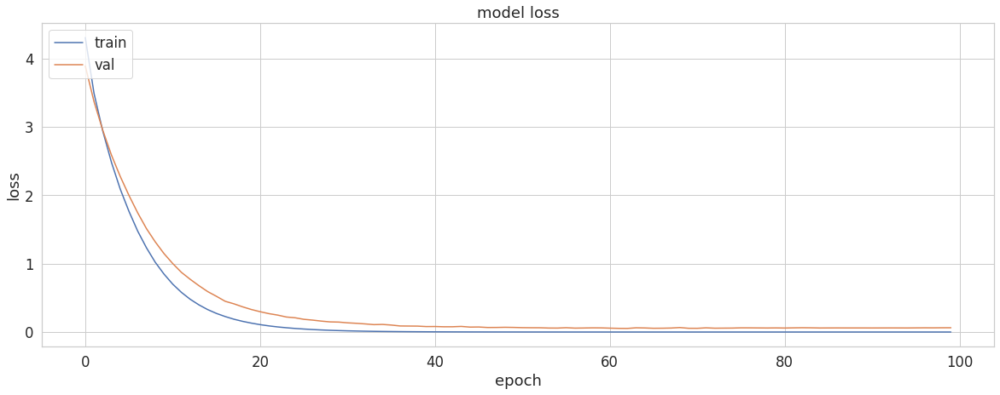

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

###**Trial_11(128)**

In [ ]:
model,history= training(128)

In [ ]:
evaluate(model,X_train,y_train)

25/25 [==============================] - 0s 1ms/step - loss: 1.4480e-07 - accuracy: 1.0000

 loss=  1.4479712717729853e-07

 Accuracy=  1.0


In [ ]:
evaluate(model,X_val,y_val)

7/7 [==============================] - 0s 2ms/step - loss: 0.0520 - accuracy: 0.9747

 loss=  0.05201888829469681

 Accuracy=  0.9747474789619446


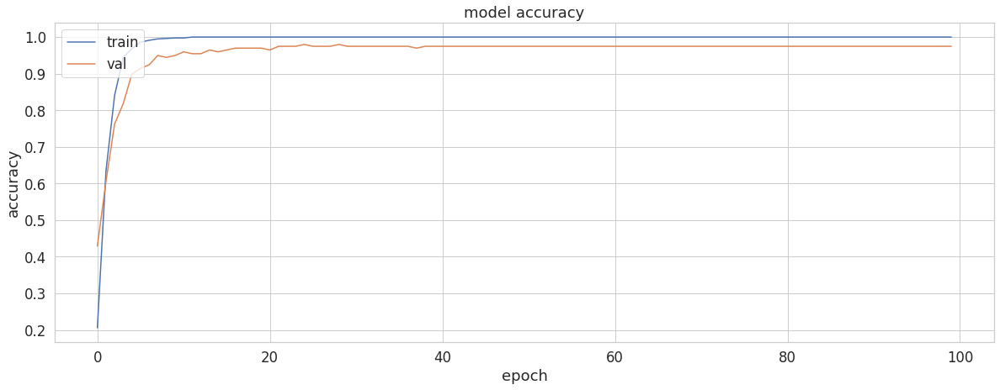

In [ ]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()


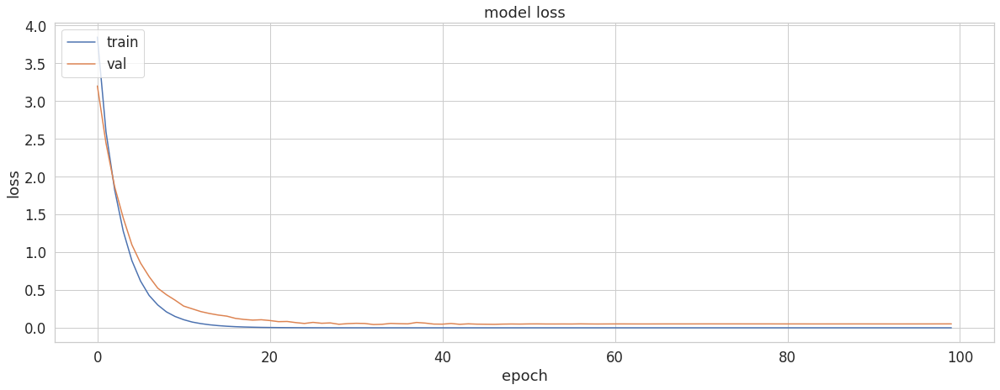

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

###**Trial_12(256)**

In [ ]:
model,history= training(256)

In [ ]:
evaluate(model,X_train,y_train)

25/25 [==============================] - 0s 1ms/step - loss: 6.4722e-08 - accuracy: 1.0000

 loss=  6.472220803743767e-08

 Accuracy=  1.0


In [ ]:
evaluate(model,X_val,y_val)

7/7 [==============================] - 0s 2ms/step - loss: 0.0657 - accuracy: 0.9798

 loss=  0.0656907930970192

 Accuracy=  0.9797979593276978


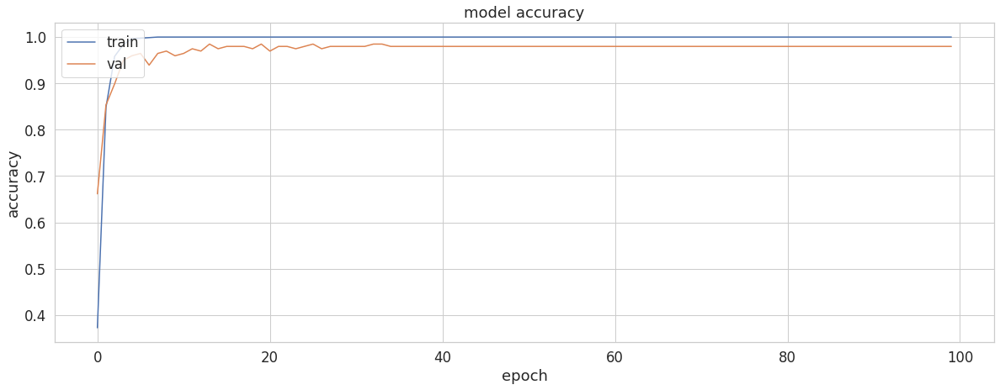

In [ ]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()


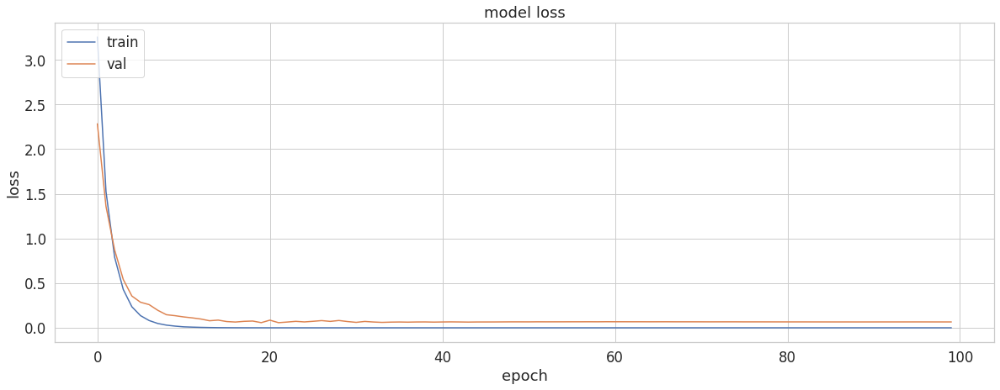

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

**Observation:** From the previous trials, we discovered that best hidden **units=256**

##**By using Dropout**

In [ ]:
def training(rate):

  # structure model
  features= X_train.shape[1]
  model = Sequential()
  
  model.add(Dense(units = 256, activation = 'tanh', input_shape=(features,)))
  
  model.add(Dropout(rate))

  model.add(Dense(units=99, activation = 'softmax'))

  # Compiling the ANN
  early_stop = EarlyStopping(monitor='val_accuracy', mode='max', min_delta=0.001)
  opt = keras.optimizers.RMSprop(learning_rate=0.001)
  model.compile(opt, loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])

  # Fitting the ANN to the Training set
  history= model.fit(X_train, y_train,validation_data=(X_val, y_val), batch_size = 32, epochs = 100,verbose=0)

  return model,history

###**Dropout 0.1**

In [ ]:
model,history= training(0.1)

In [ ]:
evaluate(model,X_train,y_train)

25/25 [==============================] - 0s 1ms/step - loss: 3.6425e-08 - accuracy: 1.0000

 loss=  3.6425056748612405e-08

 Accuracy=  1.0


In [ ]:
evaluate(model,X_val,y_val)

7/7 [==============================] - 0s 3ms/step - loss: 0.0849 - accuracy: 0.9747

 loss=  0.08487392961978912

 Accuracy=  0.9747474789619446


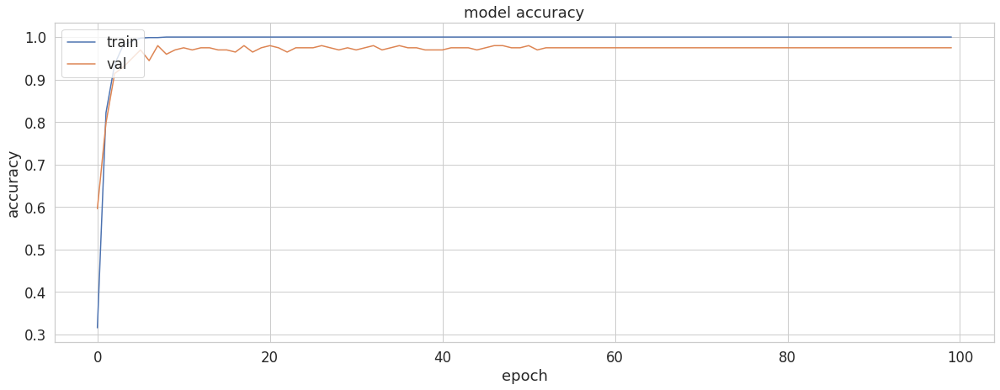

In [ ]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()


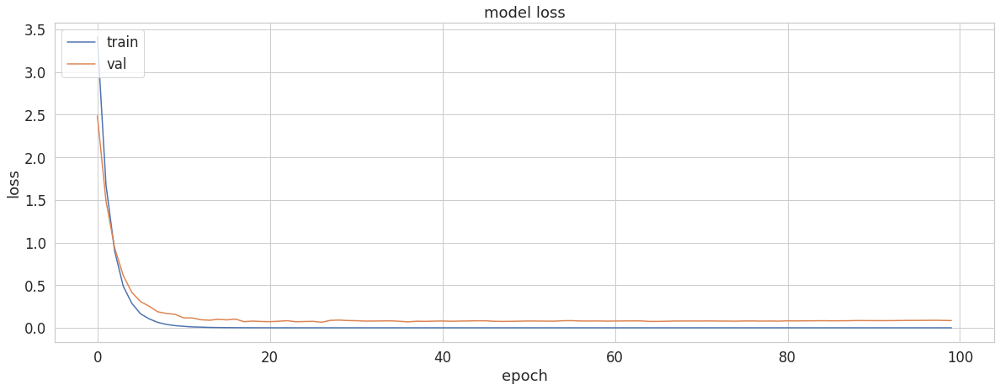

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

###**Dropout 0.2**

In [ ]:
model,history= training(0.2)

In [ ]:
evaluate(model,X_train,y_train)

25/25 [==============================] - 0s 2ms/step - loss: 1.7761e-08 - accuracy: 1.0000

 loss=  1.776097846573066e-08

 Accuracy=  1.0


In [ ]:
evaluate(model,X_val,y_val)

7/7 [==============================] - 0s 2ms/step - loss: 0.0585 - accuracy: 0.9848

 loss=  0.058490458875894547

 Accuracy=  0.9848484992980957


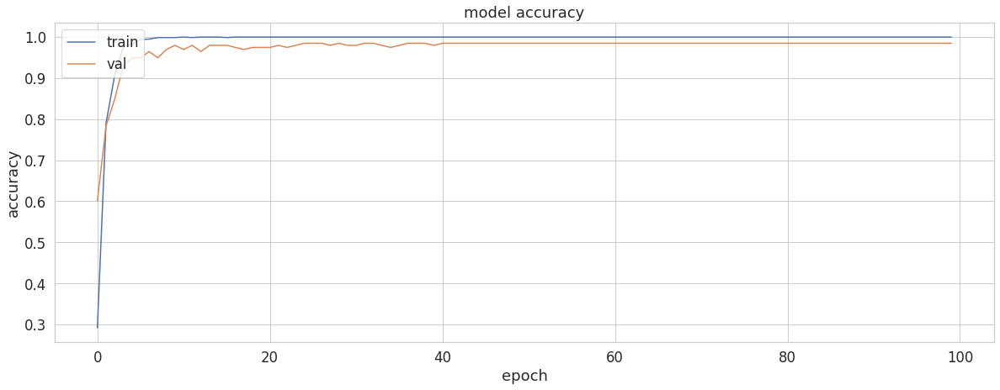

In [ ]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

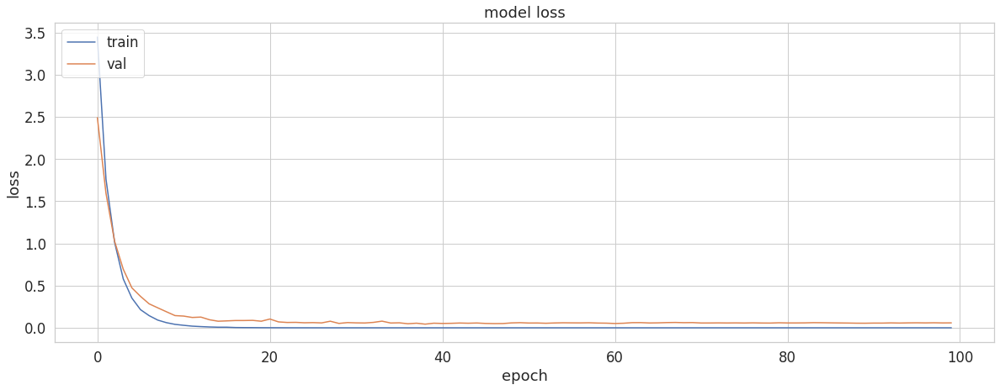

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

###**Dropout 0.3**

In [ ]:
model,history= training(0.3)

In [ ]:
evaluate(model,X_train,y_train)

25/25 [==============================] - 0s 2ms/step - loss: 9.9341e-09 - accuracy: 1.0000

 loss=  9.934105982267738e-09

 Accuracy=  1.0


In [ ]:
evaluate(model,X_val,y_val)

7/7 [==============================] - 0s 2ms/step - loss: 0.0872 - accuracy: 0.9747

 loss=  0.0872066393494606

 Accuracy=  0.9747474789619446


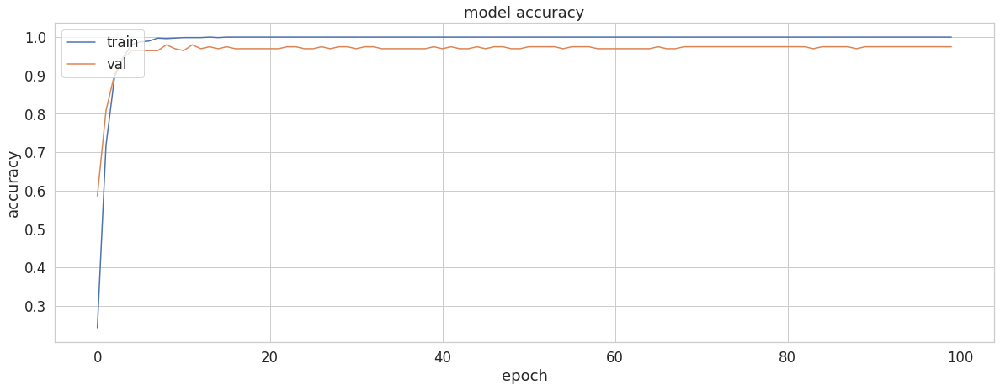

In [ ]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()


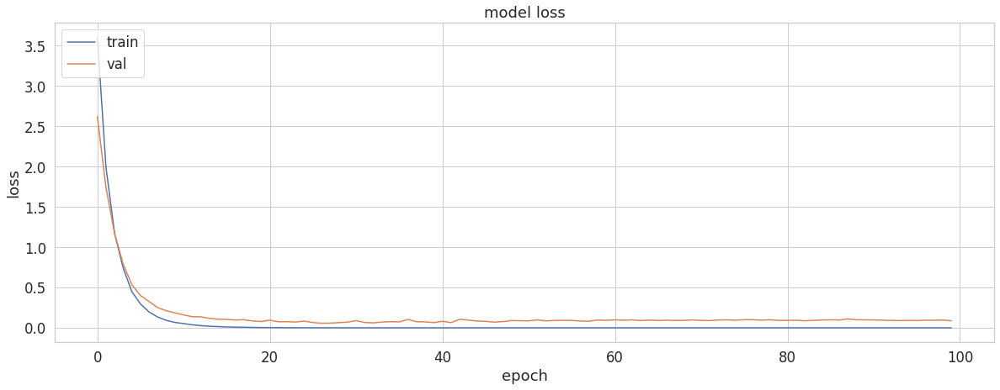

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

**Observation:** From the previous trials, we discovered that best Dropout  **rate=0.2**